# PHSC 213 Lab 2: Wave Superposition

In this lab, we'll be exploring wave superposition, inference and doing some signal processing. We won't be collecting any data today. Instead we'll be working with files that contain audio recordings.

In our first lab, we connected a speaker to a microphone to show how we could convert a sound wave (pressure wave) into an electrical signal which we could observe on an oscilloscope.

When your computer plays a sound, kind of the opposite thing takes place. An audio file contains the amplitude of a voltage signal which your computer sends to the the speaker (or headphones). The speaker membrane is driven to vibrate by the voltage, and this generates sound waves which you can hear.


We'll be using some samples of different instruments from [this](https://www.philharmonia.co.uk/explore/sound_samples) collection of free recordings which we've converted into wav format.

In [137]:
%matplotlib notebook

In [138]:
from IPython.display import Audio, Image,HTML
from IPython import display
import soundfile as sf
import numpy as np

In [245]:
samplerate

44100

In [397]:
def high_pass_filter(audio_data, sample_rate=44100, min_f = 20, max_f=500):
    freqs = np.fft.rfftfreq(len(audio_data), d=1.0/samplerate)
    audio_fft = np.fft.rfft(audio_data)
    audio_fft[freqs < min_f] = 0
    audio_fft[freqs > max_f] = 0
    return np.fft.irfft(audio_fft)

def snippet(audio_data, ts, duration, percent_max=pe):
    min_ts = ts[audio_data < np.max(audio_data)]
    max_t_loud = max(min_ts[min])

In [398]:
def make_plots(audio_file):
    ys, sampling_rate = soundfile.read(audio_file)
    # collapse to mono
    if len(ys.shape) == 2:
        ys.sum(axis=1)
        
    ys = high_pass_filter(ys, sampling_rate, min_f=100)
    plt.figure()
    
    ts = np.linspace(0, len(ys) / samplerate, len(ys))
    plot = plt.plot(ts, ys)
    
    freqs = np.fft.rfftfreq(len(ys), d=1.0/samplerate)
    audio_fft = np.fft.rfft(ys)
    power_spectrum = np.log(np.real(audio_fft * audio_fft.conj()))
    max_indices, peak_data = find_peaks(power_spectrum, height=5, distance=100)
    amplitudes = np.sqrt(np.exp(peak_data['peak_heights']))
    phases = np.arctan(
        np.imag(audio_fft),
        np.real(audio_fft),
    )

    plt.figure()
    plt.plot(freqs, power_spectrum, '-b')
    plt.plot(freqs[max_indices], power_spectrum[max_indices], 'or')
    plt.xlim(0, 4000)
    
    plt.figure()
    plt.plot(freqs, phases, '-b')
    plt.plot(freqs[max_indices], phases[max_indices], 'or')
    plt.xlim(0, 4000)
    return peak_frequencies, amplitudes, phases

def write_sinewaves_to_audio_file(
        filename,
        amplitudes,
        frequencies,
        phases=None,
        duration=5,
        sample_rate=44100
    ):
    
    ys = np.zeros(duration * sample_rate)
    ts = np.linspace(0, duration, duration * sample_rate)
    if phases is None:
        phases = np.zeros(len(amplitudes))
    for f, a, p in zip(frequencies, amplitudes, phases):
        ys += a * np.cos(2 * np.pi * f * ts + p)
    
    ys /= np.max(ys)
    with open(filename, 'wb') as outf:
        soundfile.write(
            file=outf,
            data=ys,
            samplerate=samplerate,
        )

In [399]:
np.arctan2?

In [400]:
from scipy.signal import find_peaks


In [401]:
audio_data, sampling_rate = soundfile.read('samples/guitara4.wav')


<IPython.core.display.Javascript object>


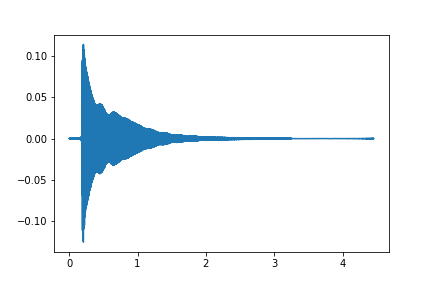

<ipython-input-398-618a0749d707>:14: RuntimeWarning: divide by zero encountered in log
  power_spectrum = np.log(np.real(audio_fft * audio_fft.conj()))


<IPython.core.display.Javascript object>


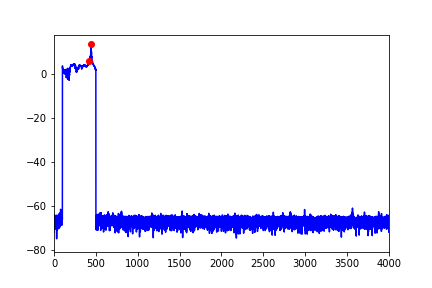

<IPython.core.display.Javascript object>


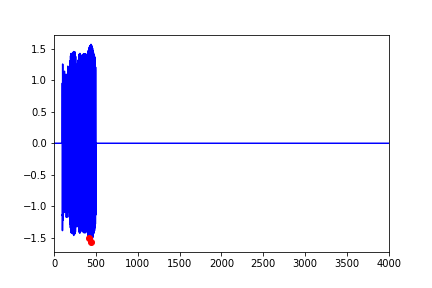

In [402]:
filename = 'samples/guitara4.wav'
peak_frequencies, amplitudes, phases = make_plots(filename)
display.display(Audio(filename))

In [395]:
len(amps)
len(amplitudes)

3

<IPython.core.display.Javascript object>


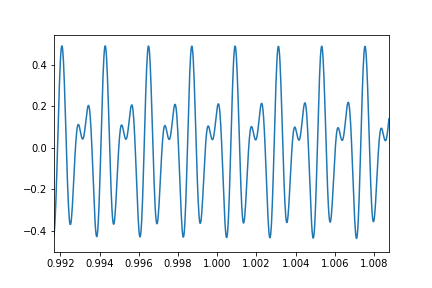

<IPython.core.display.Javascript object>


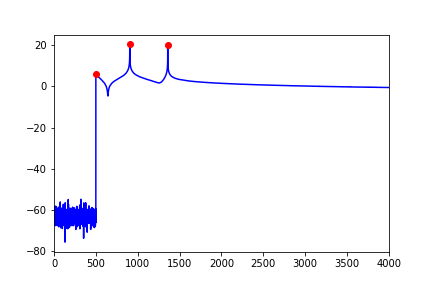

<IPython.core.display.Javascript object>


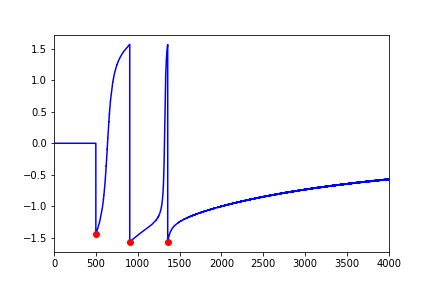

In [396]:
filename = 'samples/test1.wav'
write_sinewaves_to_audio_file(
    frequencies=peak_frequencies,
    amplitudes=amplitudes,
    phases=phases,
    filename='samples/test1.wav'
)
peaks, amps, phases = make_plots(filename)
display.display(Audio(filename))

[ 452.57631548  905.15263095 1358.77657679 1811.35289227 2263.92920774
 2716.50552322 3169.0818387  3620.61052382 4078.42499109 4526.81078513
 5885.58736192] [32796.27409489   263.76878917 41615.56753339   361.54311148
  6903.1353065    175.89204417  1196.70018325  7203.48793083
  6786.30220974  6074.40429667  2787.0712759 ]


<IPython.core.display.Javascript object>


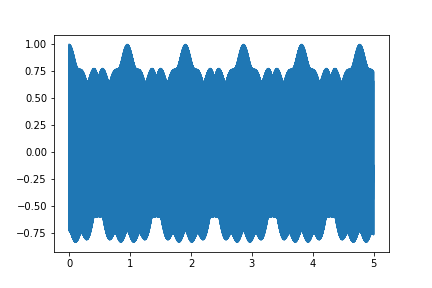

<IPython.core.display.Javascript object>


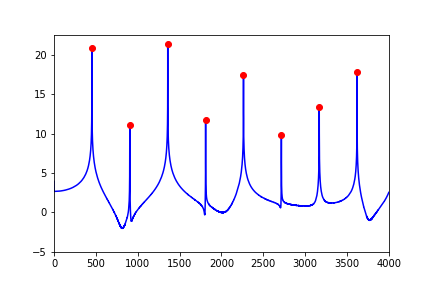

[ 452.57631548  905.15263095 1358.77657679 1811.35289227 2263.92920774
 2716.50552322 3169.0818387  3620.61052382 4078.42499109 4526.81078513
 5885.58736192] [33405.2643702    252.91780664 42689.95382777   353.83287307
  6137.65459622   137.16869378   820.62268603  7260.42229325
  6512.07296182  6056.20287482  2870.7828646 ]


In [349]:
filename = 'samples/test1.wav'
print(peaks, amps)
write_sinewaves_to_audio_file(
    frequencies=peaks,
    amplitudes=amps,
    filename='samples/test1.wav'
)

peaks, amps = make_plots(filename)

print(peaks, amps)

display.display(Audio(filename))

In [265]:
#audio_fft = np.fft.fft(audio_data)

In [272]:
samplerate

44100

In [271]:
len(audio_fft)

21048

In [274]:
freqs[0:10]

array([0.        , 1.04763036, 2.09526072, 3.14289108, 4.19052144,
       5.2381518 , 6.28578216, 7.33341252, 8.38104288, 9.42867324])

In [282]:
audio_fft.shape

(21048,)

<IPython.core.display.Javascript object>


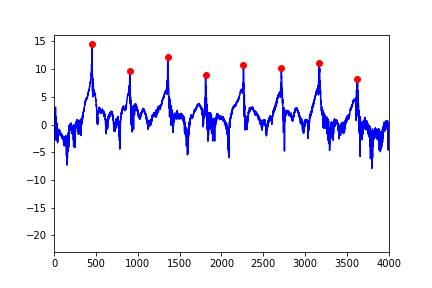

(0, 4000)

In [300]:
Audio('samples/test1.wav')

In [285]:
peak_frequencies

array([ 452.57631548,  905.15263095, 1358.77657679, 1811.35289227,
       2263.92920774, 2716.50552322, 3169.0818387 , 3620.61052382,
       4078.42499109, 4526.81078513, 5885.58736192])

array([1.90943510e+06, 1.68038642e+04, 2.16205072e+05, 7.07819528e+03,
       4.30554069e+04, 2.65997192e+04, 6.77041701e+04, 3.85479956e+03,
       1.69854503e+02, 3.18431032e+02, 1.98782544e+02])

<IPython.core.display.Javascript object>


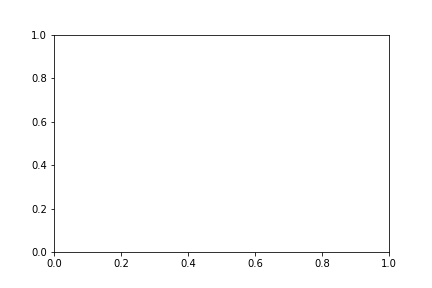

ValueError: x and y must have same first dimension, but have shapes (196463,) and (1,)

In [197]:
ys = make_plots(audio_file='samples/guitara4.wav')

In [159]:
display.display(ys)

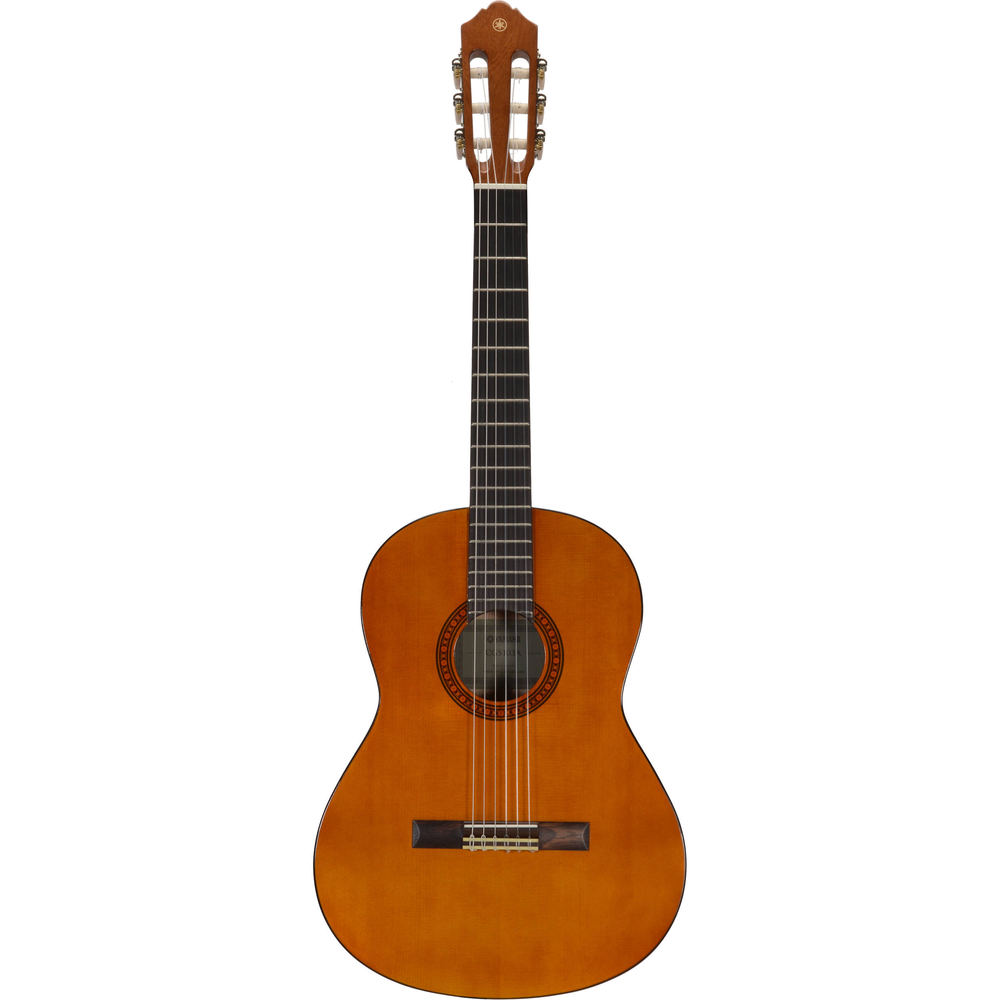

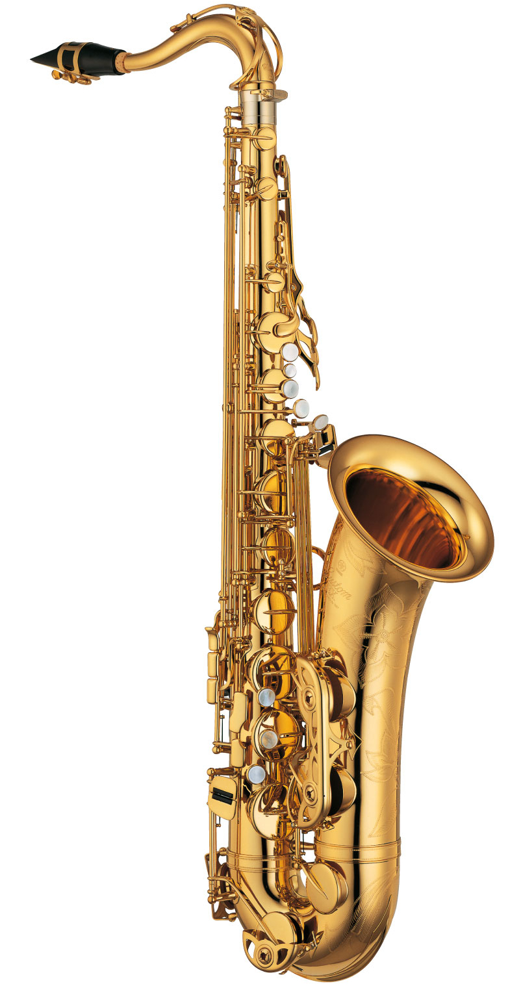

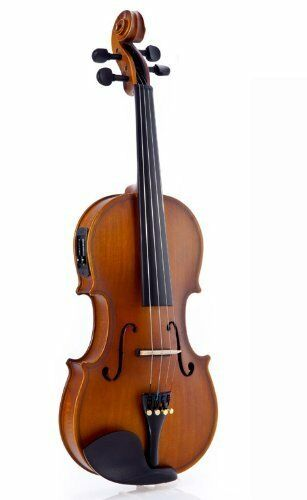

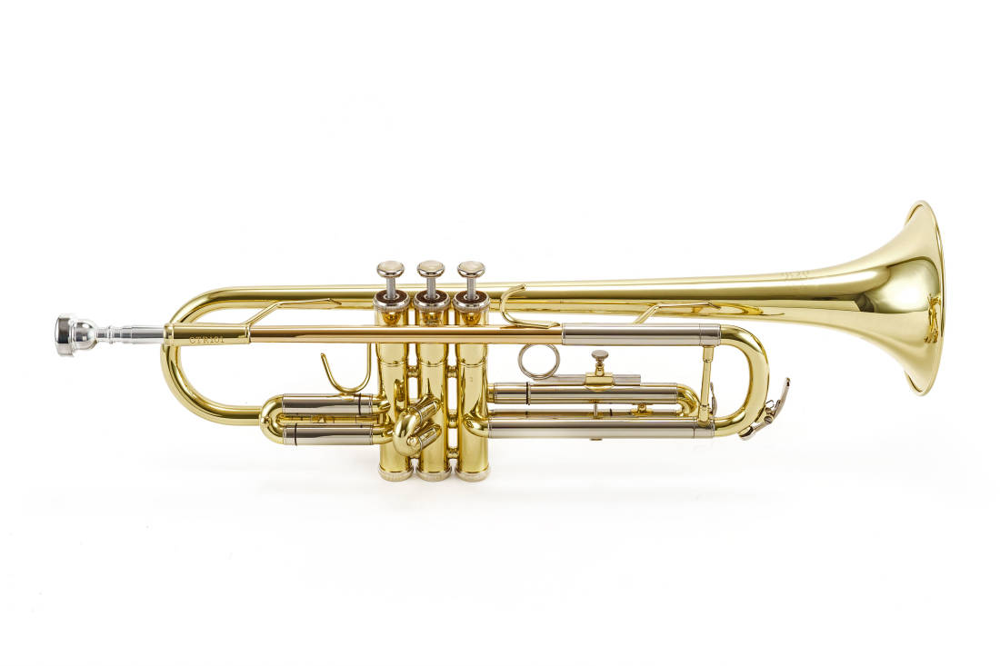

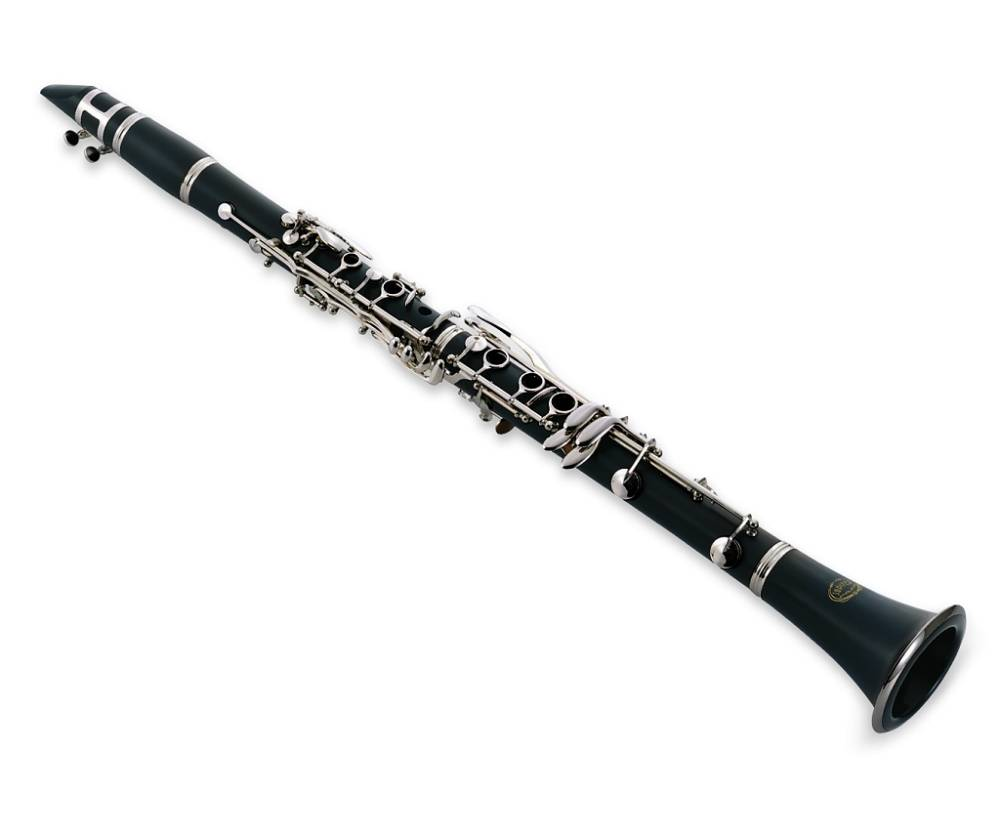

In [161]:
instruments = ['guitar', 'sax', 'violin', 'trumpet', 'clarinet']
for instrument in instruments:
    display.display(
        HTML('<t>{}</t>'.format(instrument)),
        Image('images/{}.jpg'.format(instrument), width=100),
        Audio('samples/{}a4.wav'.format(instrument))
    )
    display.display(HTML('<hr>'))

In [3]:
%matplotlib inline

## Turn on a global progress bar

In [10]:
data, samplerate = sf.read('samples/audio_01.wav')

In [15]:
from matplotlib import pyplot as plt

In [18]:
samplerate

44100

In [80]:
seconds = 10
start = 44100 
end = int(start + 44100 * seconds)
ts = np.linspace(0, seconds, samplerate*seconds)

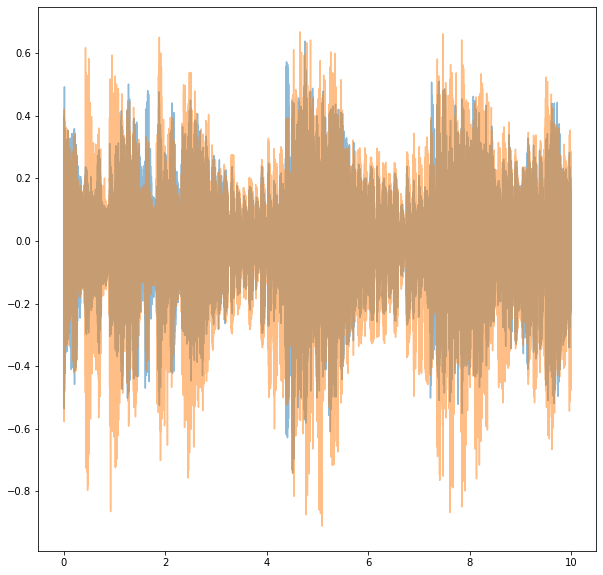

In [46]:
plt.figure(figsize=(10,10))
plt.plot(ts, data[start:end], alpha=0.5)

In [50]:
!rm samples/snippet.wav

In [51]:
with open('samples/snippet.wav', 'wb') as outf:
    soundfile.write(
        file=outf,
        data=data[start:end],
        samplerate=samplerate,
    )

In [52]:
Audio('samples/snippet.wav')

In [82]:
!rm 'samples/cosine.wav'

rm: cannot remove 'samples/cosine.wav': No such file or directory


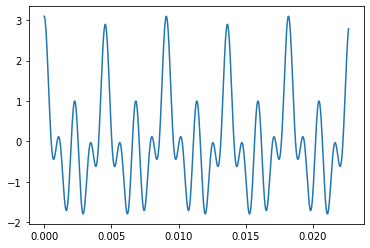

In [91]:
f = 110
ys = 0.1* np.array([np.cos(2 * np.pi * f * ts),np.cos(2 * np.pi * f * ts)]).T
f = 220
ys += np.array([np.cos(2 * np.pi * f * ts),np.cos(2 * np.pi * f * ts)]).T
f = 440
ys += np.array([np.cos(2 * np.pi * f * ts),np.cos(2 * np.pi * f * ts)]).T
f = 880
ys += np.array([np.cos(2 * np.pi * f * ts),np.cos(2 * np.pi * f * ts)]).T

plt.plot(ts[0:1000], ys[0:1000, 1])
len(ts)
with open('samples/cosine.wav', 'wb') as outf:
    soundfile.write(
        file=outf,
        data=ys,
        samplerate=samplerate,
    )

In [88]:
Audio('samples/cosine.wav')

In [94]:
def mono_fft(signal, channel=0):
    return np.rfft(signal[:,0])

In [3]:
progress_bar = ProgressBar()
1s.register()

## Generate fake data

In [4]:
import dask.dataframe as dd

In [5]:
df = dd.demo.make_timeseries(start='2000', end='2015', dtypes={'A': float, 'B': int},
                             freq='5s', partition_freq='3M', seed=1234)

## Compute and plot a cumulative sum

[########################################] | 100% Completed | 16.5s


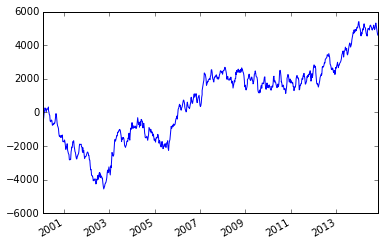

In [6]:
df.A.cumsum().resample('1w').mean().compute().plot();